To run this, press "*Runtime*" and press "*Run all*" on a **free** Tesla T4 Google Colab instance!
<div class="align-center">
<a href="https://unsloth.ai/"><img src="https://github.com/unslothai/unsloth/raw/main/images/unsloth%20new%20logo.png" width="115"></a>
<a href="https://discord.gg/unsloth"><img src="https://github.com/unslothai/unsloth/raw/main/images/Discord button.png" width="145"></a>
<a href="https://docs.unsloth.ai/"><img src="https://github.com/unslothai/unsloth/blob/main/images/documentation%20green%20button.png?raw=true" width="125"></a></a> Join Discord if you need help + ⭐ <i>Star us on <a href="https://github.com/unslothai/unsloth">Github</a> </i> ⭐
</div>

To install Unsloth on your own computer, follow the installation instructions on our Github page [here](https://docs.unsloth.ai/get-started/installing-+-updating).

You will learn how to do [data prep](#Data), how to [train](#Train), how to [run the model](#Inference), & [how to save it](#Save)


### News

Unsloth now supports Text-to-Speech (TTS) models. Read our [guide here](https://docs.unsloth.ai/basics/text-to-speech-tts-fine-tuning).

Read our **[Gemma 3N Guide](https://docs.unsloth.ai/basics/gemma-3n-how-to-run-and-fine-tune)** and check out our new **[Dynamic 2.0](https://docs.unsloth.ai/basics/unsloth-dynamic-2.0-ggufs)** quants which outperforms other quantization methods!

Visit our docs for all our [model uploads](https://docs.unsloth.ai/get-started/all-our-models) and [notebooks](https://docs.unsloth.ai/get-started/unsloth-notebooks).


### Installation

In [1]:
%%capture
import os
if "COLAB_" not in "".join(os.environ.keys()):
    !pip install unsloth
else:
    # Do this only in Colab notebooks! Otherwise use pip install unsloth
    !pip install --no-deps bitsandbytes accelerate xformers==0.0.29.post3 peft trl triton cut_cross_entropy unsloth_zoo
    !pip install sentencepiece protobuf "datasets>=3.4.1,<4.0.0" huggingface_hub hf_transfer
    !pip install --no-deps unsloth

### Unsloth

In [2]:
from unsloth import FastVisionModel # FastLanguageModel for LLMs
import torch

# 4bit pre quantized models we support for 4x faster downloading + no OOMs.
fourbit_models = [
    "unsloth/Llama-3.2-11B-Vision-Instruct-bnb-4bit", # Llama 3.2 vision support
    "unsloth/Llama-3.2-11B-Vision-bnb-4bit",
    "unsloth/Llama-3.2-90B-Vision-Instruct-bnb-4bit", # Can fit in a 80GB card!
    "unsloth/Llama-3.2-90B-Vision-bnb-4bit",

    "unsloth/Pixtral-12B-2409-bnb-4bit",              # Pixtral fits in 16GB!
    "unsloth/Pixtral-12B-Base-2409-bnb-4bit",         # Pixtral base model

    "unsloth/Qwen2-VL-2B-Instruct-bnb-4bit",          # Qwen2 VL support
    "unsloth/Qwen2-VL-7B-Instruct-bnb-4bit",
    "unsloth/Qwen2-VL-72B-Instruct-bnb-4bit",

    "unsloth/llava-v1.6-mistral-7b-hf-bnb-4bit",      # Any Llava variant works!
    "unsloth/llava-1.5-7b-hf-bnb-4bit",
] # More models at https://huggingface.co/unsloth

model, tokenizer = FastVisionModel.from_pretrained(
    "unsloth/Llama-3.2-11B-Vision-Instruct",
    load_in_4bit = True, # Use 4bit to reduce memory use. False for 16bit LoRA.
    use_gradient_checkpointing = "unsloth", # True or "unsloth" for long context
)

🦥 Unsloth: Will patch your computer to enable 2x faster free finetuning.
🦥 Unsloth Zoo will now patch everything to make training faster!
==((====))==  Unsloth 2025.7.8: Fast Mllama patching. Transformers: 4.53.2.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.6.0+cu124. CUDA: 7.5. CUDA Toolkit: 12.4. Triton: 3.2.0
\        /    Bfloat16 = FALSE. FA [Xformers = 0.0.29.post3. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!


model.safetensors.index.json: 0.00B [00:00, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.97G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/2.94G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/210 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/477 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/17.2M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/454 [00:00<?, ?B/s]

chat_template.json: 0.00B [00:00, ?B/s]

We now add LoRA adapters for parameter efficient finetuning - this allows us to only efficiently train 1% of all parameters.

**[NEW]** We also support finetuning ONLY the vision part of the model, or ONLY the language part. Or you can select both! You can also select to finetune the attention or the MLP layers!

In [3]:
model = FastVisionModel.get_peft_model(
    model,
    finetune_vision_layers     = True, # False if not finetuning vision layers
    finetune_language_layers   = True, # False if not finetuning language layers
    finetune_attention_modules = True, # False if not finetuning attention layers
    finetune_mlp_modules       = True, # False if not finetuning MLP layers

    r = 16,           # The larger, the higher the accuracy, but might overfit
    lora_alpha = 16,  # Recommended alpha == r at least
    lora_dropout = 0,
    bias = "none",
    random_state = 3407,
    use_rslora = False,  # We support rank stabilized LoRA
    loftq_config = None, # And LoftQ
    # target_modules = "all-linear", # Optional now! Can specify a list if needed
)

Unsloth: Making `model.base_model.model.model.vision_model.transformer` require gradients


<a name="Data"></a>
### Data Prep
We'll be using a sampled version of the ROCO radiography dataset. You can access the dataset [here](https://huggingface.co/datasets/unsloth/Radiology_mini). The full dataset is [here](https://huggingface.co/datasets/eltorio/ROCOv2-radiology).

The dataset includes X-rays, CT scans and ultrasounds showcasing medical conditions and diseases. Each image has a caption written by experts describing it. The goal is to finetune a VLM to make it a useful analysis tool for medical professionals.


In [4]:
from datasets import load_dataset

dataset = load_dataset("unsloth/Radiology_mini", split="train")

README.md:   0%|          | 0.00/610 [00:00<?, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/79.2M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1978 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/327 [00:00<?, ? examples/s]

Let's take a look at the dataset, and check what the 1st example shows:

In [5]:
dataset

Dataset({
    features: ['image', 'image_id', 'caption', 'cui'],
    num_rows: 1978
})

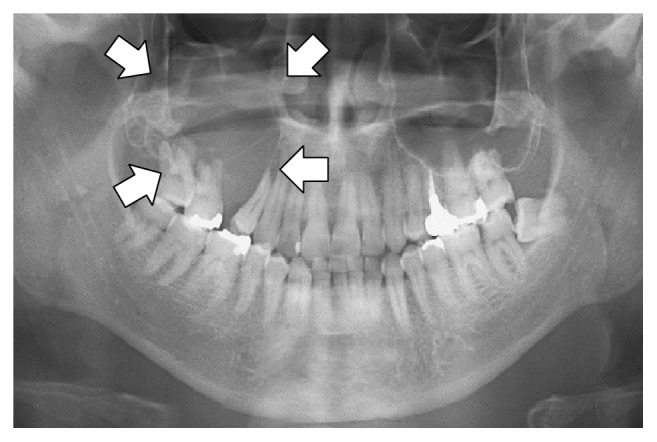

In [6]:
dataset[0]["image"]

In [7]:
dataset[0]["caption"]

'Panoramic radiography shows an osteolytic lesion in the right posterior maxilla with resorption of the floor of the maxillary sinus (arrows).'

To format the dataset, all vision finetuning tasks should be formatted as follows:

```python
[
{ "role": "user",
  "content": [{"type": "text",  "text": instruction}, {"type": "image", "image": image} ]
},
{ "role": "assistant",
  "content": [{"type": "text",  "text": answer} ]
},
]
```

We will craft an custom instruction asking the VLM to be an expert radiographer. Notice also instead of just 1 instruction, you can add multiple turns to make it a dynamic conversation.

In [8]:
instruction = "You are an expert radiographer. Describe accurately what you see in this image."

def convert_to_conversation(sample):
    conversation = [
        { "role": "user",
          "content" : [
            {"type" : "text",  "text"  : instruction},
            {"type" : "image", "image" : sample["image"]} ]
        },
        { "role" : "assistant",
          "content" : [
            {"type" : "text",  "text"  : sample["caption"]} ]
        },
    ]
    return { "messages" : conversation }
pass

Let's convert the dataset into the "correct" format for finetuning:

In [9]:
converted_dataset = [convert_to_conversation(sample) for sample in dataset]

The first example is now structured like below:

In [10]:
converted_dataset[0]

{'messages': [{'role': 'user',
   'content': [{'type': 'text',
     'text': 'You are an expert radiographer. Describe accurately what you see in this image.'},
    {'type': 'image',
     'image': <PIL.PngImagePlugin.PngImageFile image mode=L size=657x442>}]},
  {'role': 'assistant',
   'content': [{'type': 'text',
     'text': 'Panoramic radiography shows an osteolytic lesion in the right posterior maxilla with resorption of the floor of the maxillary sinus (arrows).'}]}]}

Before we do any finetuning, maybe the vision model already knows how to analyse the images? Let's check if this is the case!

In [11]:
FastVisionModel.for_inference(model) # Enable for inference!

image = dataset[0]["image"]
instruction = "You are an expert radiographer. Describe accurately what you see in this image."

messages = [
    {"role": "user", "content": [
        {"type": "image"},
        {"type": "text", "text": instruction}
    ]}
]
input_text = tokenizer.apply_chat_template(messages, add_generation_prompt = True)
inputs = tokenizer(
    image,
    input_text,
    add_special_tokens = False,
    return_tensors = "pt",
).to("cuda")

from transformers import TextStreamer
text_streamer = TextStreamer(tokenizer, skip_prompt = True)
_ = model.generate(**inputs, streamer = text_streamer, max_new_tokens = 128,
                   use_cache = True, temperature = 1.5, min_p = 0.1)

This radiograph appears to be a panoramic view of the upper and lower dentition, specifically an Orthopantomogram (OPG).

* The panoramic radiograph demonstrates normal dental structures.
* There is an abnormal area on the upper right, represented by an area of radiolucent bone, corresponding to the antrum.

**Key Observations**

* The bone between the left upper teeth is relatively radiopaque.
* There are two large dark areas between the upper central incisors and molars on the right side. One of the areas contains the antrum. The other is likely an area of resorbed alveolar bone


In [14]:
# Funciones corregidas para modelo Unsloth ya cargado
from google.colab import files
from transformers import TextStreamer
import io
import requests
from PIL import Image
import torch
import gc

def upload_image():
    """Permite al usuario subir una imagen"""
    print("Selecciona una imagen para subir:")
    uploaded = files.upload()

    if not uploaded:
        print("No se subió ninguna imagen")
        return None

    filename = next(iter(uploaded))
    image_data = uploaded[filename]

    try:
        image = Image.open(io.BytesIO(image_data))
        print(f"✓ Imagen cargada: {filename}")
        print(f"Tamaño original: {image.size}")

        # Redimensionar si es muy grande
        max_size = 1024
        if max(image.size) > max_size:
            image.thumbnail((max_size, max_size), Image.Resampling.LANCZOS)
            print(f"Imagen redimensionada a: {image.size}")

        return image

    except Exception as e:
        print(f"Error procesando imagen: {e}")
        return None

def load_image_from_url(url):
    """Carga imagen desde URL"""
    try:
        print(f"Descargando imagen desde: {url}")
        response = requests.get(url, stream=True)
        image = Image.open(response.raw)

        print(f"✓ Imagen descargada")
        print(f"Tamaño original: {image.size}")

        max_size = 1024
        if max(image.size) > max_size:
            image.thumbnail((max_size, max_size), Image.Resampling.LANCZOS)
            print(f"Imagen redimensionada a: {image.size}")

        return image

    except Exception as e:
        print(f"Error descargando imagen: {e}")
        return None

def analyze_image_unsloth(image, instruction, max_tokens=128):
    """Analiza imagen exactamente como en el ejemplo de Unsloth"""
    try:
        # Mostrar la imagen
        display(image)
        print(f"\nInstrucción: {instruction}")

        # Habilitar modelo para inferencia
        model.eval()

        # Crear mensajes exactamente como en el ejemplo de Unsloth
        messages = [
            {"role": "user", "content": [
                {"type": "image"},
                {"type": "text", "text": instruction}
            ]}
        ]

        print("Aplicando chat template...")

        # Usar tokenizer como en el ejemplo
        input_text = tokenizer.apply_chat_template(messages, add_generation_prompt=True)

        print("Procesando inputs...")

        # Tokenizar exactamente como en el ejemplo de Unsloth
        inputs = tokenizer(
            image,
            input_text,
            add_special_tokens=False,
            return_tensors="pt",
        ).to("cuda")

        print("Generando respuesta con streaming...")

        # TextStreamer exactamente como en el ejemplo
        text_streamer = TextStreamer(tokenizer, skip_prompt=True)

        print("\n" + "="*50)
        print("RESPUESTA (STREAMING):")
        print("="*50)

        # Generar exactamente como en el ejemplo de Unsloth
        with torch.inference_mode():
            _ = model.generate(
                **inputs,
                streamer=text_streamer,
                max_new_tokens=max_tokens,
                use_cache=True,
                temperature=1.5,
                min_p=0.1
            )

        print("\n" + "="*50)

        # Limpiar memoria
        del inputs
        torch.cuda.empty_cache()

        return "✓ Análisis completado"

    except Exception as e:
        print(f"Error: {e}")
        print(f"Tipo de error: {type(e).__name__}")

        # Debug info
        print("\nInformación de debug:")
        print(f"¿Existe 'tokenizer'? {'tokenizer' in globals()}")
        print(f"¿Existe 'model'? {'model' in globals()}")
        print(f"Tipo de imagen: {type(image)}")

        return None

def radiologist_analysis(image):
    """Análisis como radiólogo experto - exacto al ejemplo de Unsloth"""
    instruction = "You are an expert radiographer. Describe accurately what you see in this image."
    return analyze_image_unsloth(image, instruction, max_tokens=128)

def custom_analysis(image, custom_instruction, max_tokens=128):
    """Análisis con instrucción personalizada"""
    return analyze_image_unsloth(image, custom_instruction, max_tokens=max_tokens)

def quick_test():
    """Test rápido con imagen de ejemplo"""
    print("=== TEST RÁPIDO ===")

    # Verificar que existan las variables necesarias
    if 'tokenizer' not in globals():
        print("❌ Error: 'tokenizer' no está definido")
        print("Asegúrate de haber ejecutado FastVisionModel.from_pretrained()")
        return

    if 'model' not in globals():
        print("❌ Error: 'model' no está definido")
        print("Asegúrate de haber ejecutado FastVisionModel.from_pretrained()")
        return

    # Imagen de ejemplo
    url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/0052a70beed5bf71b92610a43a52df6d286cd5f3/diffusers/rabbit.jpg"
    image = load_image_from_url(url)

    if image:
        radiologist_analysis(image)
    else:
        print("Error cargando imagen de ejemplo")

def test_upload():
    """Test subiendo tu propia imagen"""
    print("=== TEST CON TU IMAGEN ===")

    # Verificar variables
    if 'tokenizer' not in globals() or 'model' not in globals():
        print("❌ Error: Necesitas 'tokenizer' y 'model' de FastVisionModel")
        return

    image = upload_image()

    if image:
        print("\nElige el tipo de análisis:")
        print("1. Como radiólogo experto")
        print("2. Descripción general")
        print("3. Pregunta personalizada")

        choice = input("Opción (1-3): ").strip()

        if choice == "1":
            radiologist_analysis(image)
        elif choice == "2":
            custom_analysis(image, "Describe detalladamente todo lo que ves en esta imagen.")
        elif choice == "3":
            custom_question = input("¿Qué quieres preguntar sobre la imagen?: ")
            tokens = input("Máximo tokens (Enter para 128): ").strip()
            max_tokens = int(tokens) if tokens.isdigit() else 128
            custom_analysis(image, custom_question, max_tokens=max_tokens)
        else:
            print("Opción no válida")
    else:
        print("No se pudo cargar la imagen")

def test_url():
    """Test con URL personalizada"""
    print("=== TEST CON URL ===")

    # Verificar variables
    if 'tokenizer' not in globals() or 'model' not in globals():
        print("❌ Error: Necesitas 'tokenizer' y 'model' de FastVisionModel")
        return

    url = input("Ingresa la URL de la imagen: ").strip()

    if url:
        image = load_image_from_url(url)
        if image:
            question = input("¿Qué quieres preguntar sobre la imagen?: ")
            tokens = input("Máximo tokens (Enter para 128): ").strip()
            max_tokens = int(tokens) if tokens.isdigit() else 128
            custom_analysis(image, question, max_tokens=max_tokens)
        else:
            print("Error cargando imagen desde URL")
    else:
        print("URL vacía")

def check_setup():
    """Verifica que todo esté configurado correctamente"""
    print("=== VERIFICACIÓN DE CONFIGURACIÓN ===")

    if 'model' in globals() and 'tokenizer' in globals():
        print("✅ Model y tokenizer detectados")
        try:
            print(f"✅ Modelo en dispositivo: {next(model.parameters()).device}")
            print("✅ Todo listo para usar")
            return True
        except Exception as e:
            print(f"❌ Error verificando modelo: {e}")
            return False
    else:
        print("❌ Faltan model y/o tokenizer")
        print("\nAsegúrate de haber ejecutado:")
        print("model, tokenizer = FastVisionModel.from_pretrained(...)")
        return False

def batch_analysis(images, instruction):
    """Análisis en lote de múltiples imágenes"""
    if not check_setup():
        return

    print(f"=== ANÁLISIS EN LOTE DE {len(images)} IMÁGENES ===")

    for i, img_source in enumerate(images):
        print(f"\n--- Procesando imagen {i+1}/{len(images)} ---")

        # Cargar imagen según el tipo de fuente
        if isinstance(img_source, str) and (img_source.startswith('http')):
            image = load_image_from_url(img_source)
        elif isinstance(img_source, str):
            # Asumir que es un path local
            try:
                image = Image.open(img_source)
            except:
                print(f"Error cargando imagen local: {img_source}")
                continue
        else:
            # Asumir que ya es una imagen PIL
            image = img_source

        if image:
            analyze_image_unsloth(image, instruction, max_tokens=64)  # Menos tokens para lote
        else:
            print(f"Error procesando imagen {i+1}")

# Funciones de test listas para usar
print("🔥 FUNCIONES CORREGIDAS PARA UNSLOTH:")
print("=" * 45)
print("check_setup() - Verificar configuración")
print("quick_test() - Test rápido con imagen de ejemplo")
print("test_upload() - Subir tu propia imagen")
print("test_url() - Cargar desde URL")
print("radiologist_analysis(imagen) - Análisis como radiólogo")
print("custom_analysis(imagen, pregunta) - Análisis personalizado")
print("batch_analysis([imágenes], instrucción) - Análisis en lote")
print("")
print("✨ PARA EMPEZAR:")
print("1. check_setup()  # Verificar que todo esté bien")
print("2. quick_test()   # Test rápido")

🔥 FUNCIONES CORREGIDAS PARA UNSLOTH:
check_setup() - Verificar configuración
quick_test() - Test rápido con imagen de ejemplo
test_upload() - Subir tu propia imagen
test_url() - Cargar desde URL
radiologist_analysis(imagen) - Análisis como radiólogo
custom_analysis(imagen, pregunta) - Análisis personalizado
batch_analysis([imágenes], instrucción) - Análisis en lote

✨ PARA EMPEZAR:
1. check_setup()  # Verificar que todo esté bien
2. quick_test()   # Test rápido


In [15]:
check_setup()

=== VERIFICACIÓN DE CONFIGURACIÓN ===
✅ Model y tokenizer detectados
✅ Modelo en dispositivo: cuda:0
✅ Todo listo para usar


True

=== TEST RÁPIDO ===
Descargando imagen desde: https://huggingface.co/datasets/huggingface/documentation-images/resolve/0052a70beed5bf71b92610a43a52df6d286cd5f3/diffusers/rabbit.jpg
✓ Imagen descargada
Tamaño original: (2048, 2688)
Imagen redimensionada a: (780, 1024)


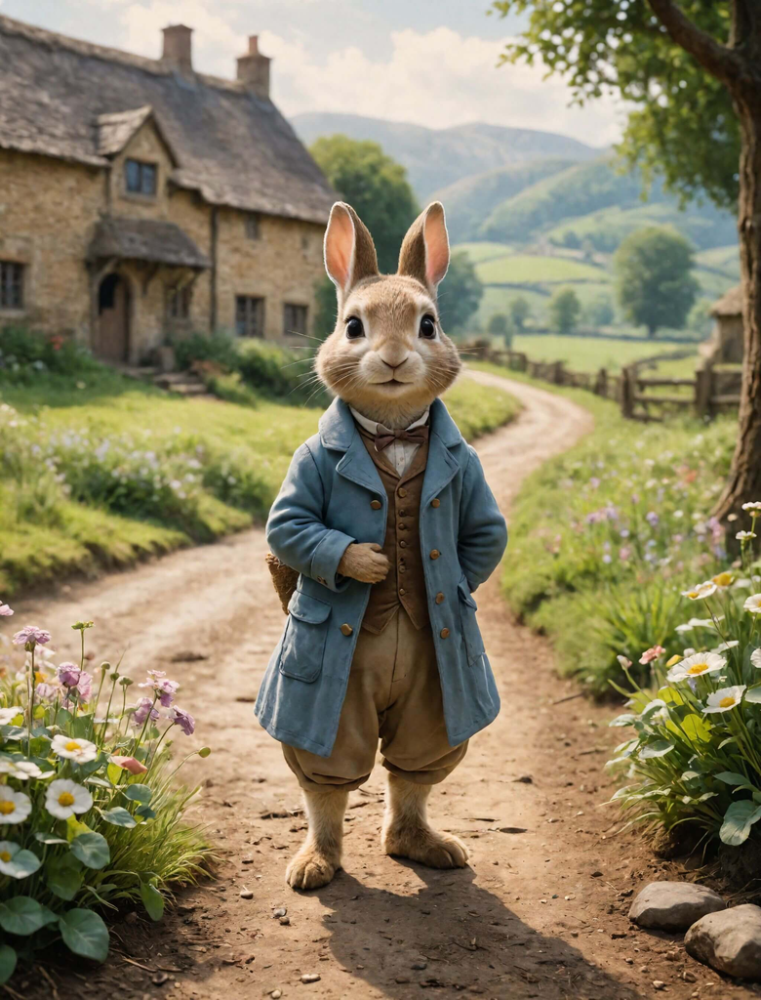


Instrucción: You are an expert radiographer. Describe accurately what you see in this image.
Aplicando chat template...
Procesando inputs...
Generando respuesta con streaming...

RESPUESTA (STREAMING):
In the image, I observe a bunny with human-like characteristics, specifically standing on a path in a village surrounded by houses. The bunny is dressed in a blue coat, brown waistcoat, tan shirt, brown trousers, and has brown boots on its feet. The rabbit has a white shirt and red tie around its neck.

**Physical Characteristics**

* The bunny is facing forward and to the left, with its head turned towards the viewer.
* Its fur is light brown and fluffy, covering its entire body except for the bottom of its feet and nose.
* The rabbit appears to be holding a basket or bag in its right hand.
*



In [16]:
quick_test()

In [20]:
%%capture
!pip install fitz
!pip install PyMuPDF pillow

In [21]:
# Extracción de texto de PDFs usando Llama Vision
import fitz  # PyMuPDF
import io
from PIL import Image
from google.colab import files
import requests
from transformers import TextStreamer
import torch
import gc

# Instalar dependencias necesarias (ejecutar en celda separada)
# !pip install PyMuPDF pillow

def upload_pdf():
    """Permite al usuario subir un PDF"""
    print("Selecciona un archivo PDF para subir:")
    uploaded = files.upload()

    if not uploaded:
        print("No se subió ningún PDF")
        return None

    filename = next(iter(uploaded))
    pdf_data = uploaded[filename]

    print(f"✓ PDF cargado: {filename}")
    return pdf_data, filename

def download_pdf_from_url(url):
    """Descarga PDF desde URL"""
    try:
        print(f"Descargando PDF desde: {url}")
        response = requests.get(url, stream=True)
        response.raise_for_status()

        pdf_data = response.content
        filename = url.split('/')[-1]
        if not filename.endswith('.pdf'):
            filename += '.pdf'

        print(f"✓ PDF descargado: {filename}")
        return pdf_data, filename

    except Exception as e:
        print(f"Error descargando PDF: {e}")
        return None, None

def pdf_to_images(pdf_data, dpi=150, max_pages=None):
    """Convierte páginas del PDF a imágenes"""
    try:
        # Abrir PDF desde bytes
        pdf_document = fitz.open(stream=pdf_data, filetype="pdf")

        total_pages = len(pdf_document)
        pages_to_process = min(max_pages or total_pages, total_pages)

        print(f"PDF tiene {total_pages} páginas")
        print(f"Procesando {pages_to_process} páginas...")

        images = []

        for page_num in range(pages_to_process):
            # Convertir página a imagen
            page = pdf_document[page_num]

            # Crear matriz de transformación para la resolución
            mat = fitz.Matrix(dpi/72, dpi/72)

            # Renderizar página como imagen
            pix = page.get_pixmap(matrix=mat)

            # Convertir a PIL Image
            img_data = pix.tobytes("ppm")
            img = Image.open(io.BytesIO(img_data))

            # Redimensionar si es muy grande
            max_size = 1024
            if max(img.size) > max_size:
                img.thumbnail((max_size, max_size), Image.Resampling.LANCZOS)

            images.append({
                'image': img,
                'page_number': page_num + 1,
                'size': img.size
            })

            print(f"✓ Página {page_num + 1} convertida ({img.size})")

        pdf_document.close()
        return images

    except Exception as e:
        print(f"Error convirtiendo PDF: {e}")
        return None

def extract_text_from_page_image(page_data, custom_instruction=None):
    """Extrae texto de una página usando el modelo de visión"""
    try:
        image = page_data['image']
        page_num = page_data['page_number']

        # Instrucción por defecto para extracción de texto
        if custom_instruction is None:
            instruction = """Extract ALL text from this image. Transcribe every word, number, and symbol you can see.
Maintain the original formatting and structure as much as possible.
Include headers, paragraphs, bullet points, and any other text elements.
If there are tables, preserve their structure.
Be thorough and accurate."""
        else:
            instruction = custom_instruction

        print(f"\n--- Procesando página {page_num} ---")
        display(image)

        # Verificar que el modelo esté disponible
        if 'tokenizer' not in globals() or 'model' not in globals():
            print("❌ Error: Necesitas model y tokenizer cargados")
            return None

        # Crear mensajes como en Unsloth
        messages = [
            {"role": "user", "content": [
                {"type": "image"},
                {"type": "text", "text": instruction}
            ]}
        ]

        # Aplicar chat template
        input_text = tokenizer.apply_chat_template(messages, add_generation_prompt=True)

        # Tokenizar
        inputs = tokenizer(
            image,
            input_text,
            add_special_tokens=False,
            return_tensors="pt",
        ).to("cuda")

        print(f"Extrayendo texto de página {page_num}...")

        # Generar con más tokens para texto completo
        with torch.inference_mode():
            output = model.generate(
                **inputs,
                max_new_tokens=512,  # Más tokens para texto largo
                use_cache=True,
                temperature=0.3,     # Temperatura baja para precisión
                min_p=0.05,
                do_sample=True,
                pad_token_id=tokenizer.eos_token_id,
            )

        # Decodificar respuesta
        response = tokenizer.decode(output[0], skip_special_tokens=True)

        # Limpiar memoria
        del inputs, output
        torch.cuda.empty_cache()

        return {
            'page_number': page_num,
            'extracted_text': response.strip(),
            'status': 'success'
        }

    except Exception as e:
        print(f"Error extrayendo texto de página {page_num}: {e}")
        return {
            'page_number': page_num,
            'extracted_text': f"Error: {e}",
            'status': 'error'
        }

def extract_text_from_pdf_complete(pdf_data, filename, max_pages=None, custom_instruction=None):
    """Extrae todo el texto de un PDF completo"""
    print(f"=== EXTRACCIÓN COMPLETA DE TEXTO - {filename} ===")

    # Convertir PDF a imágenes
    images = pdf_to_images(pdf_data, max_pages=max_pages)

    if not images:
        print("Error: No se pudieron convertir las páginas del PDF")
        return None

    # Extraer texto de cada página
    all_text_results = []

    for page_data in images:
        result = extract_text_from_page_image(page_data, custom_instruction)
        if result:
            all_text_results.append(result)

    # Compilar resultado final
    complete_text = []
    complete_text.append(f"=== TEXTO EXTRAÍDO DE: {filename} ===\n")

    for result in all_text_results:
        if result['status'] == 'success':
            complete_text.append(f"\n--- PÁGINA {result['page_number']} ---")
            complete_text.append(result['extracted_text'])
            complete_text.append("\n" + "-"*50)
        else:
            complete_text.append(f"\n--- PÁGINA {result['page_number']} (ERROR) ---")
            complete_text.append(result['extracted_text'])

    final_text = "\n".join(complete_text)

    # Mostrar resultado
    print("\n" + "="*60)
    print("TEXTO COMPLETO EXTRAÍDO:")
    print("="*60)
    print(final_text)
    print("="*60)

    # Guardar en archivo
    output_filename = f"texto_extraido_{filename.replace('.pdf', '')}.txt"

    try:
        with open(output_filename, 'w', encoding='utf-8') as f:
            f.write(final_text)
        print(f"\n✓ Texto guardado en: {output_filename}")

        # Descargar automáticamente en Colab
        files.download(output_filename)

    except Exception as e:
        print(f"Error guardando archivo: {e}")

    return {
        'filename': filename,
        'pages_processed': len(all_text_results),
        'full_text': final_text,
        'results_by_page': all_text_results
    }

def extract_text_streaming_mode(pdf_data, filename, max_pages=None):
    """Extrae texto con streaming en tiempo real"""
    print(f"=== EXTRACCIÓN CON STREAMING - {filename} ===")

    images = pdf_to_images(pdf_data, max_pages=max_pages)

    if not images:
        return None

    instruction = """Extract ALL text from this image. Transcribe every word accurately, maintaining formatting and structure."""

    all_text = []

    for page_data in images:
        image = page_data['image']
        page_num = page_data['page_number']

        print(f"\n--- PÁGINA {page_num} (STREAMING) ---")
        display(image)

        # Crear mensajes
        messages = [
            {"role": "user", "content": [
                {"type": "image"},
                {"type": "text", "text": instruction}
            ]}
        ]

        input_text = tokenizer.apply_chat_template(messages, add_generation_prompt=True)
        inputs = tokenizer(image, input_text, add_special_tokens=False, return_tensors="pt").to("cuda")

        # Streaming
        text_streamer = TextStreamer(tokenizer, skip_prompt=True)

        print("Texto extraído:")
        print("-" * 40)

        with torch.inference_mode():
            output = model.generate(
                **inputs,
                streamer=text_streamer,
                max_new_tokens=512,
                use_cache=True,
                temperature=0.3,
                min_p=0.05
            )

        print("-" * 40)

        # Guardar para compilación final
        response = tokenizer.decode(output[0], skip_special_tokens=True)
        all_text.append(f"PÁGINA {page_num}:\n{response.strip()}\n\n")

        del inputs, output
        torch.cuda.empty_cache()

    return all_text

def pdf_text_extraction_menu():
    """Menú interactivo para extracción de texto de PDFs"""
    print("=== EXTRACCIÓN DE TEXTO DE PDFs ===")
    print("1. Subir PDF desde computadora")
    print("2. Descargar PDF desde URL")
    print("3. Usar PDF de ejemplo")

    choice = input("\nSelecciona opción (1-3): ").strip()

    pdf_data, filename = None, None

    if choice == "1":
        pdf_data, filename = upload_pdf()
    elif choice == "2":
        url = input("Ingresa URL del PDF: ").strip()
        if url:
            pdf_data, filename = download_pdf_from_url(url)
    elif choice == "3":
        # PDF de ejemplo (puedes cambiarlo)
        example_url = "https://www.w3.org/WAI/ER/tests/xhtml/testfiles/resources/pdf/dummy.pdf"
        pdf_data, filename = download_pdf_from_url(example_url)
    else:
        print("Opción no válida")
        return

    if not pdf_data:
        print("No se pudo cargar el PDF")
        return

    # Opciones de procesamiento
    print(f"\n=== OPCIONES PARA {filename} ===")
    print("1. Extraer todo el texto (modo completo)")
    print("2. Extraer con streaming en tiempo real")
    print("3. Solo primeras 3 páginas")
    print("4. Análisis personalizado")

    process_choice = input("Selecciona procesamiento (1-4): ").strip()

    if process_choice == "1":
        extract_text_from_pdf_complete(pdf_data, filename)
    elif process_choice == "2":
        extract_text_streaming_mode(pdf_data, filename)
    elif process_choice == "3":
        extract_text_from_pdf_complete(pdf_data, filename, max_pages=3)
    elif process_choice == "4":
        custom_inst = input("Instrucción personalizada (ej: 'Solo extrae títulos y subtítulos'): ")
        max_pages_input = input("Máximo páginas (Enter para todas): ").strip()
        max_pages = int(max_pages_input) if max_pages_input.isdigit() else None
        extract_text_from_pdf_complete(pdf_data, filename, max_pages=max_pages, custom_instruction=custom_inst)
    else:
        print("Opción no válida")

# Función rápida para prueba
def quick_pdf_test():
    """Test rápido con PDF de ejemplo"""
    example_url = "https://www.w3.org/WAI/ER/tests/xhtml/testfiles/resources/pdf/dummy.pdf"
    pdf_data, filename = download_pdf_from_url(example_url)

    if pdf_data:
        extract_text_from_pdf_complete(pdf_data, filename, max_pages=2)
    else:
        print("Error descargando PDF de ejemplo")

# Información de uso
print("📄 EXTRACCIÓN DE TEXTO DE PDFs CON LLAMA VISION:")
print("=" * 55)
print("pdf_text_extraction_menu() - Menú interactivo completo")
print("quick_pdf_test() - Test rápido con PDF ejemplo")
print("upload_pdf() - Solo subir PDF")
print("extract_text_from_pdf_complete(pdf_data, filename) - Extracción completa")
print("")
print("⚠️  NOTA: Instala PyMuPDF primero:")
print("!pip install PyMuPDF")
print("")
print("✨ PARA EMPEZAR:")
print("pdf_text_extraction_menu()")

📄 EXTRACCIÓN DE TEXTO DE PDFs CON LLAMA VISION:
pdf_text_extraction_menu() - Menú interactivo completo
quick_pdf_test() - Test rápido con PDF ejemplo
upload_pdf() - Solo subir PDF
extract_text_from_pdf_complete(pdf_data, filename) - Extracción completa

⚠️  NOTA: Instala PyMuPDF primero:
!pip install PyMuPDF

✨ PARA EMPEZAR:
pdf_text_extraction_menu()


=== EXTRACCIÓN DE TEXTO DE PDFs ===
1. Subir PDF desde computadora
2. Descargar PDF desde URL
3. Usar PDF de ejemplo

Selecciona opción (1-3): 1
Selecciona un archivo PDF para subir:


Saving Foto.pdf to Foto.pdf
✓ PDF cargado: Foto.pdf

=== OPCIONES PARA Foto.pdf ===
1. Extraer todo el texto (modo completo)
2. Extraer con streaming en tiempo real
3. Solo primeras 3 páginas
4. Análisis personalizado
Selecciona procesamiento (1-4): 1
=== EXTRACCIÓN COMPLETA DE TEXTO - Foto.pdf ===
PDF tiene 2 páginas
Procesando 2 páginas...
✓ Página 1 convertida ((791, 1024))
✓ Página 2 convertida ((791, 1024))

--- Procesando página 1 ---


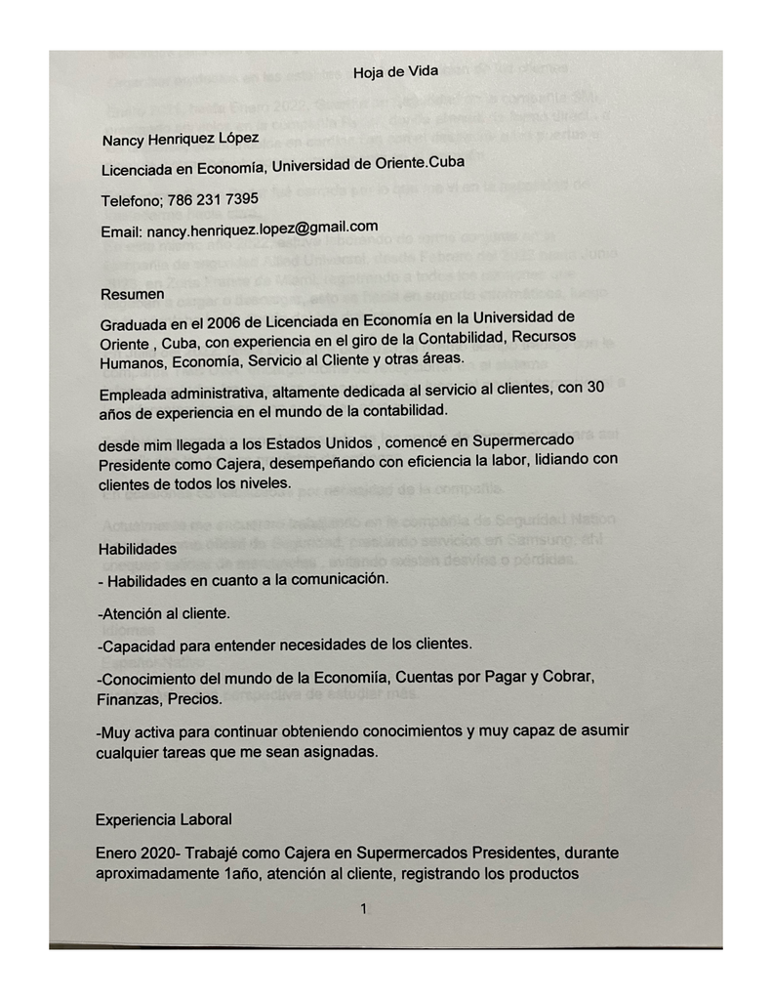

Extrayendo texto de página 1...

--- Procesando página 2 ---


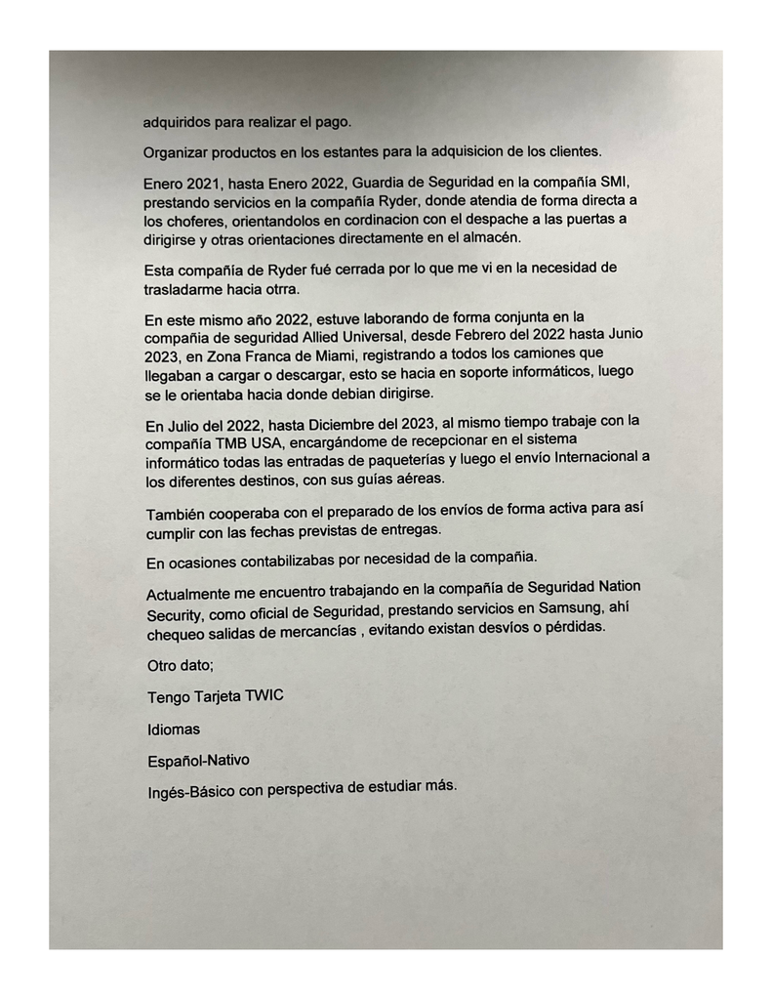

Extrayendo texto de página 2...

TEXTO COMPLETO EXTRAÍDO:
=== TEXTO EXTRAÍDO DE: Foto.pdf ===


--- PÁGINA 1 ---
user

Extract ALL text from this image. Transcribe every word, number, and symbol you can see. 
Maintain the original formatting and structure as much as possible. 
Include headers, paragraphs, bullet points, and any other text elements.
If there are tables, preserve their structure.
Be thorough and accurate.assistant

The image presents a resume in Spanish, featuring the following text:

**Header**
Hoja de Vida

**Name and Contact Information**
Nancy Henriquez López
Licenciada en Economía, Universidad de Oriente. Cuba
Telefono; 786 231 7395
Email: nancy.henriquez.lopez@gmail.com

**Summary**
Resumen

Graduada en el 2006 de Licenciada en Economía en la Universidad de Oriente, Cuba, con experiencia en el giro de la Contabilidad, Recursos Humanos, Economía, Servicio al Cliente y otras áreas.

Empleada administrativa, altamente dedicada al servicio al clientes, con 30 años de e

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
pdf_text_extraction_menu()

=== EXTRACCIÓN DE TEXTO DE PDFs ===
1. Subir PDF desde computadora
2. Descargar PDF desde URL
3. Usar PDF de ejemplo

Selecciona opción (1-3): 1
Selecciona un archivo PDF para subir:


Saving MANUAL+AUTO+JULIO+2025 (4).pdf to MANUAL+AUTO+JULIO+2025 (4).pdf
✓ PDF cargado: MANUAL+AUTO+JULIO+2025 (4).pdf

=== OPCIONES PARA MANUAL+AUTO+JULIO+2025 (4).pdf ===
1. Extraer todo el texto (modo completo)
2. Extraer con streaming en tiempo real
3. Solo primeras 3 páginas
4. Análisis personalizado
Selecciona procesamiento (1-4): 1
=== EXTRACCIÓN COMPLETA DE TEXTO - MANUAL+AUTO+JULIO+2025 (4).pdf ===
PDF tiene 18 páginas
Procesando 18 páginas...
✓ Página 1 convertida ((725, 1024))
✓ Página 2 convertida ((725, 1024))
✓ Página 3 convertida ((725, 1024))
✓ Página 4 convertida ((725, 1024))
✓ Página 5 convertida ((725, 1024))
✓ Página 6 convertida ((725, 1024))
✓ Página 7 convertida ((725, 1024))
✓ Página 8 convertida ((725, 1024))
✓ Página 9 convertida ((725, 1024))
✓ Página 10 convertida ((725, 1024))
✓ Página 11 convertida ((725, 1024))
✓ Página 12 convertida ((725, 1024))
✓ Página 13 convertida ((725, 1024))
✓ Página 14 convertida ((725, 1024))
✓ Página 15 convertida ((725, 1024)

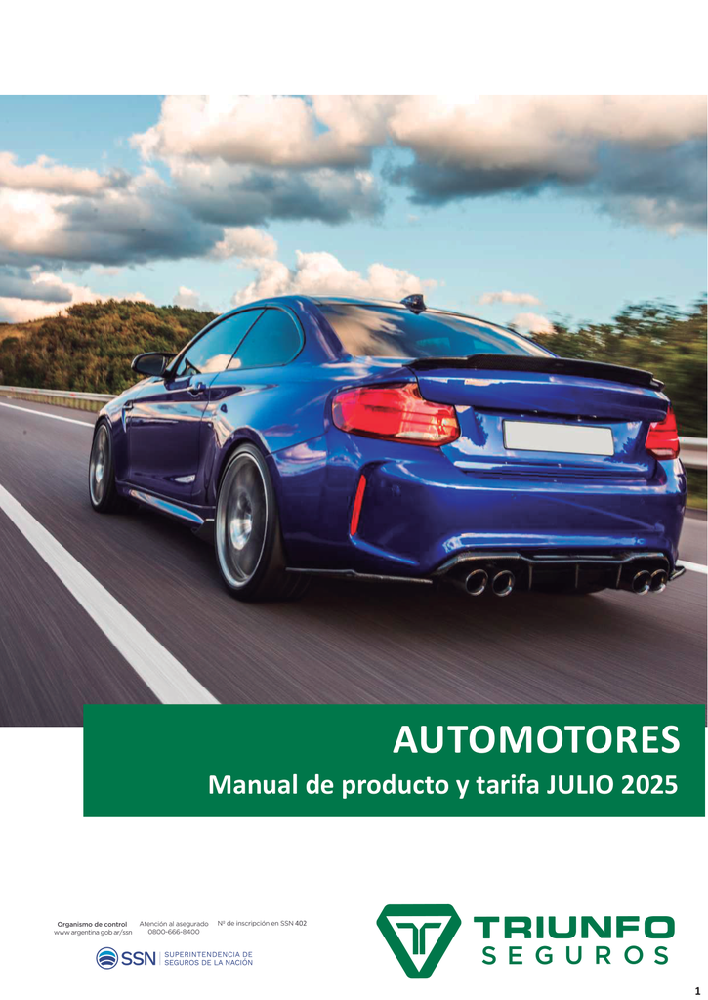

Extrayendo texto de página 1...

--- Procesando página 2 ---


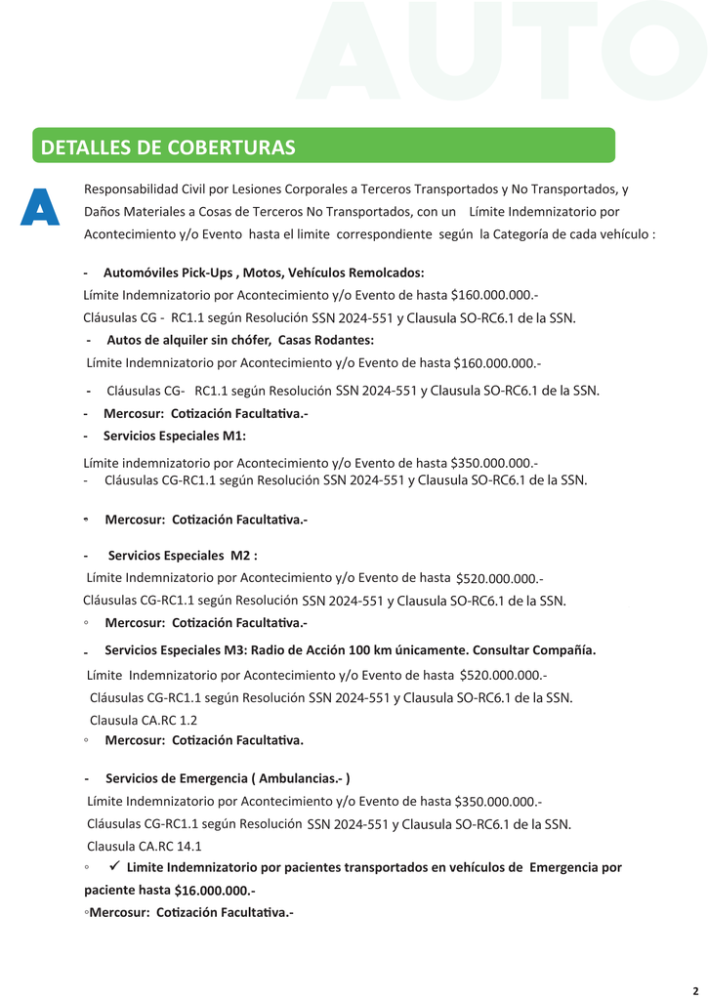

Extrayendo texto de página 2...

--- Procesando página 3 ---


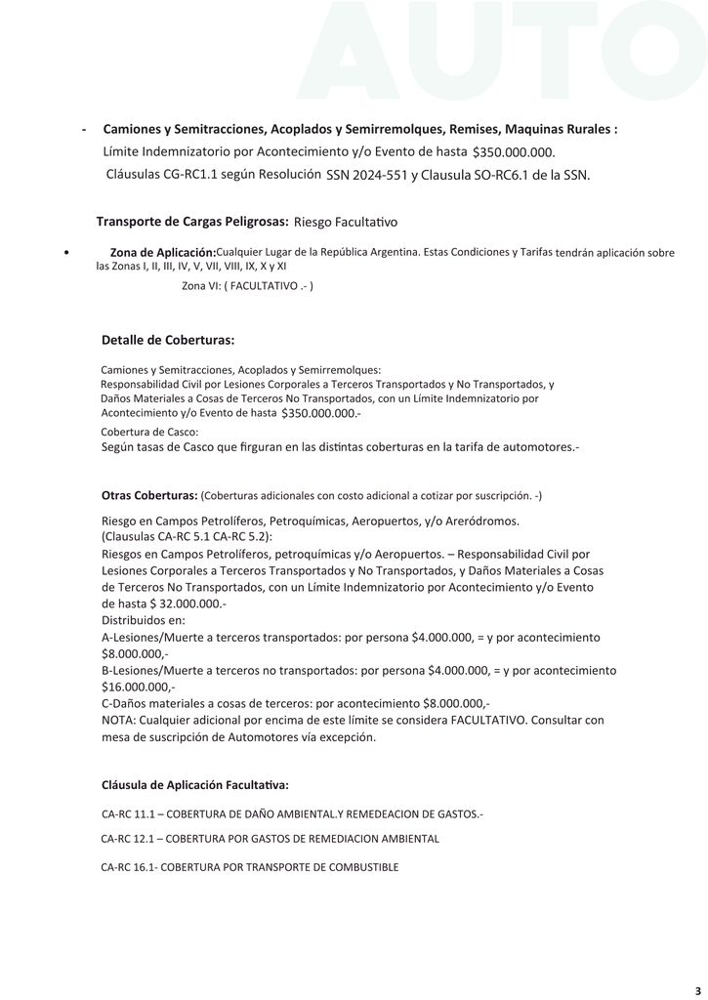

Extrayendo texto de página 3...

--- Procesando página 4 ---


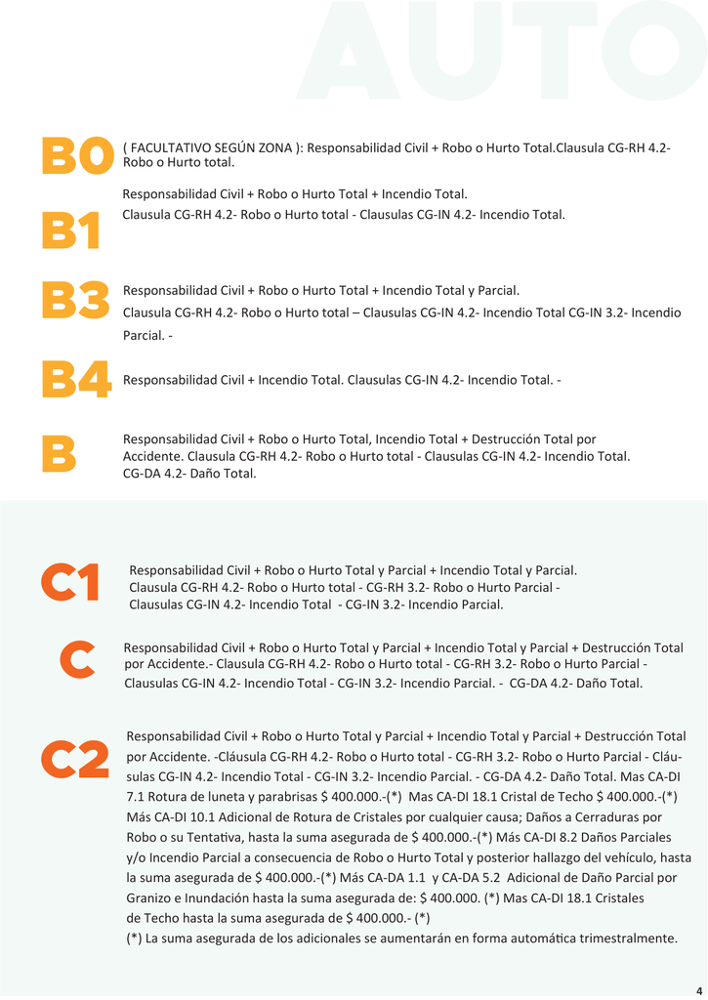

Extrayendo texto de página 4...

--- Procesando página 5 ---


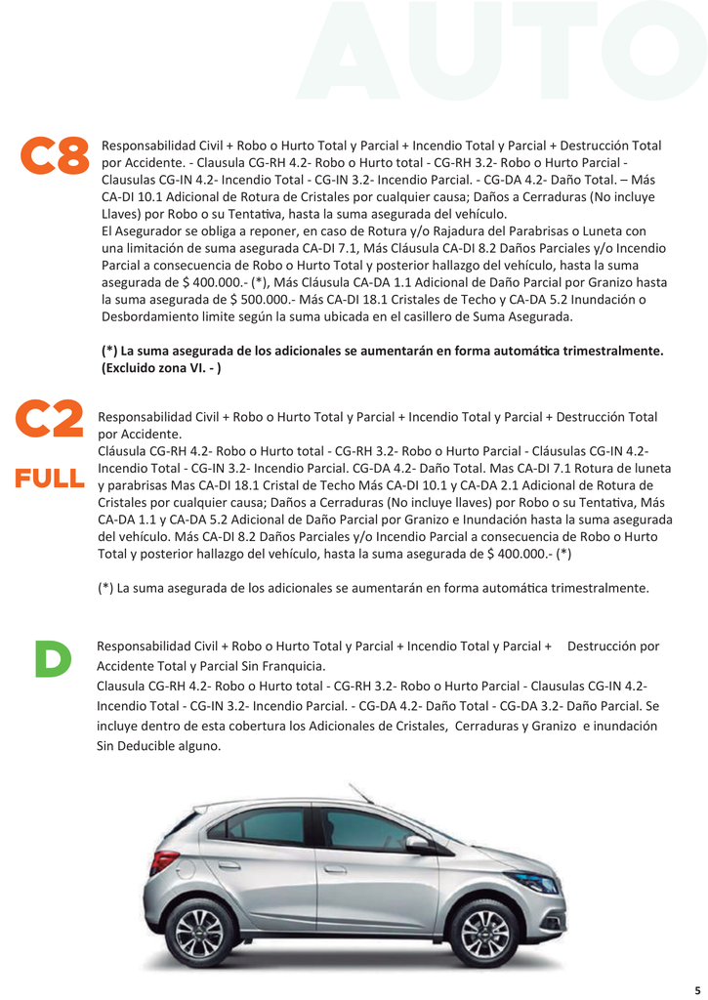

Extrayendo texto de página 5...

--- Procesando página 6 ---


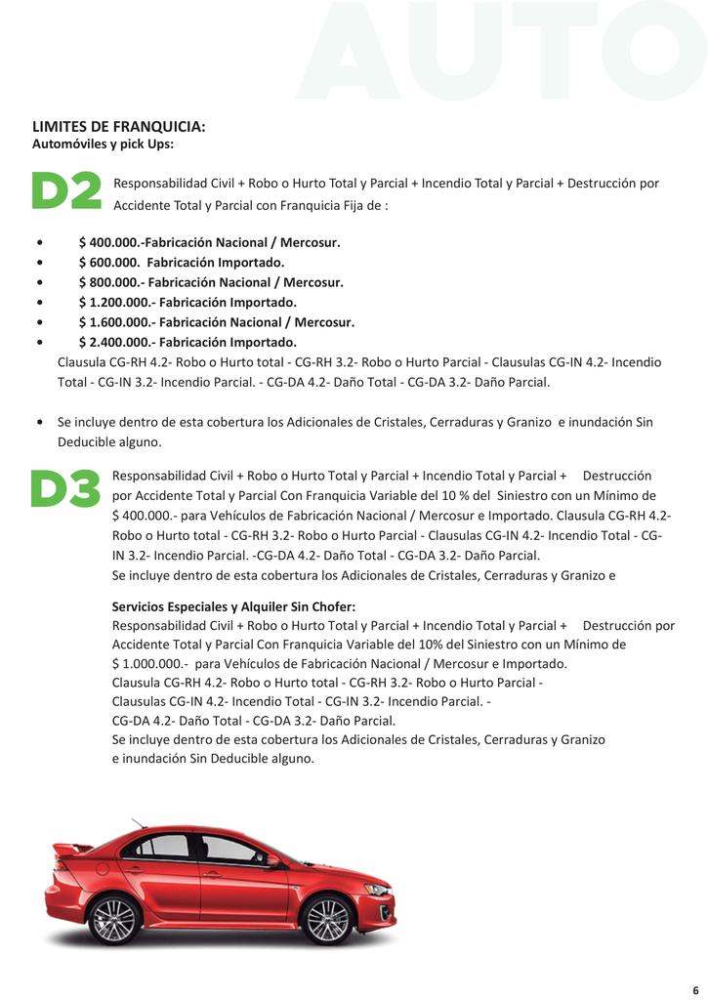

Extrayendo texto de página 6...

--- Procesando página 7 ---


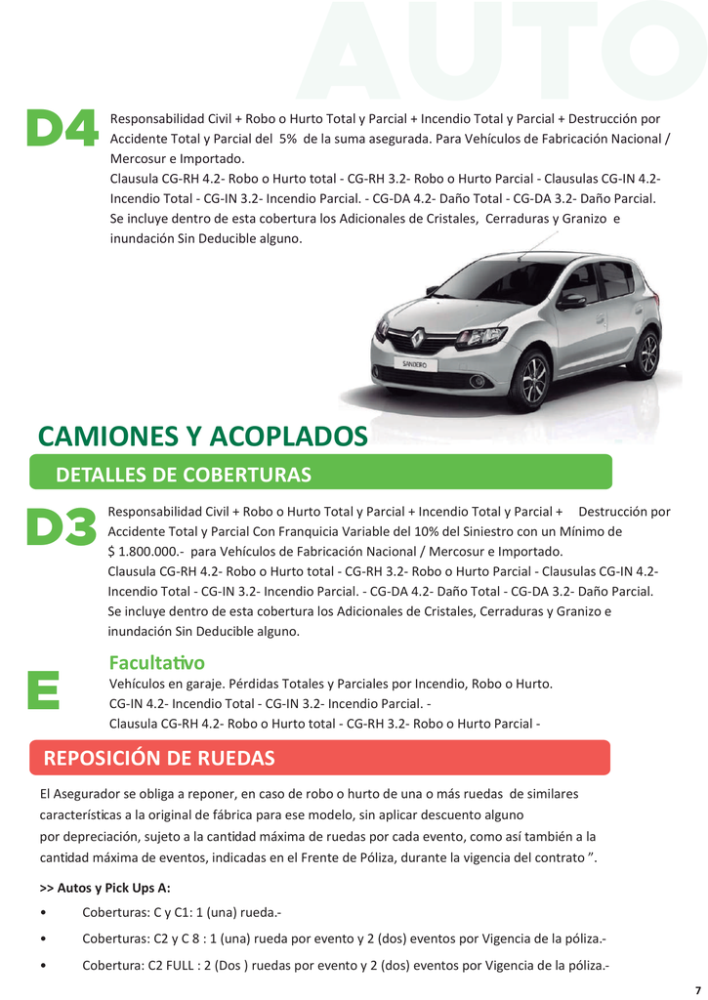

Extrayendo texto de página 7...

--- Procesando página 8 ---


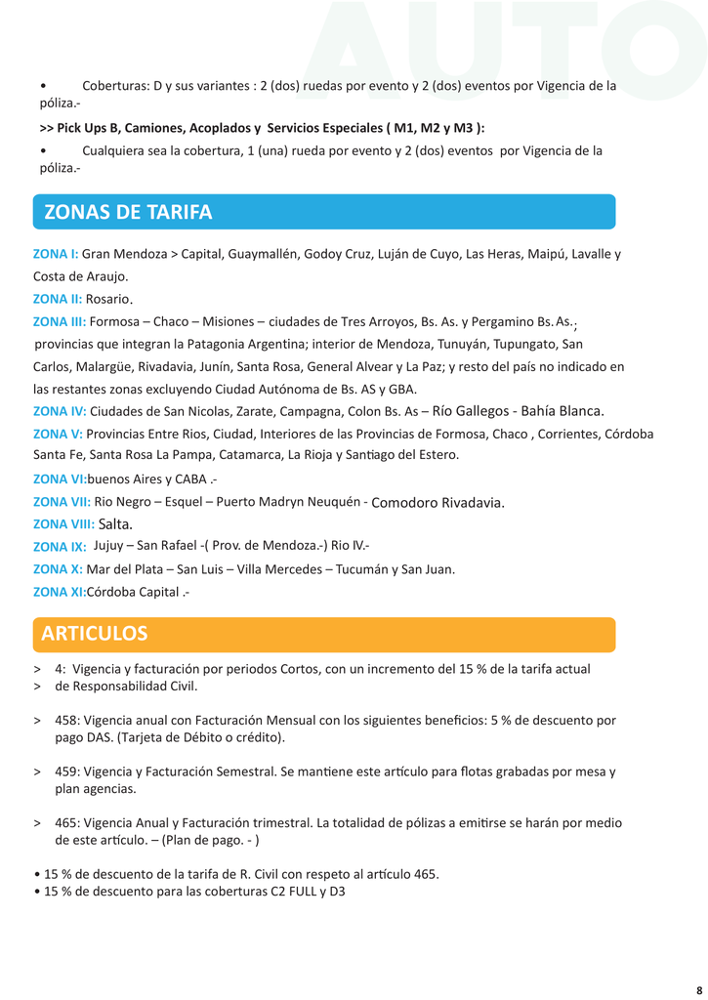

Extrayendo texto de página 8...

--- Procesando página 9 ---


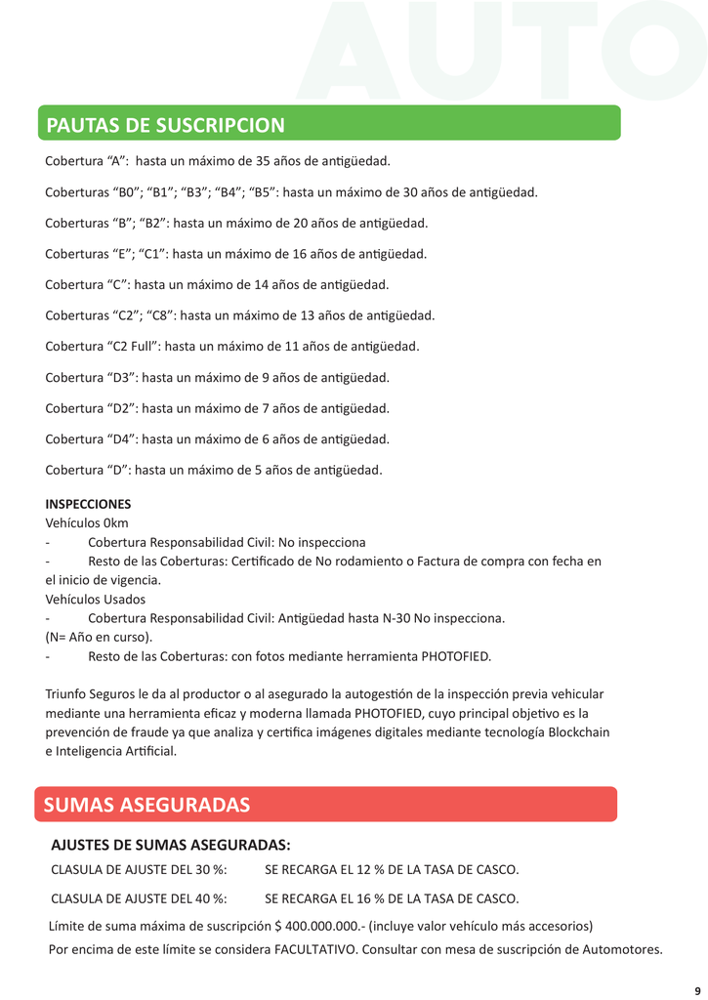

Extrayendo texto de página 9...

--- Procesando página 10 ---


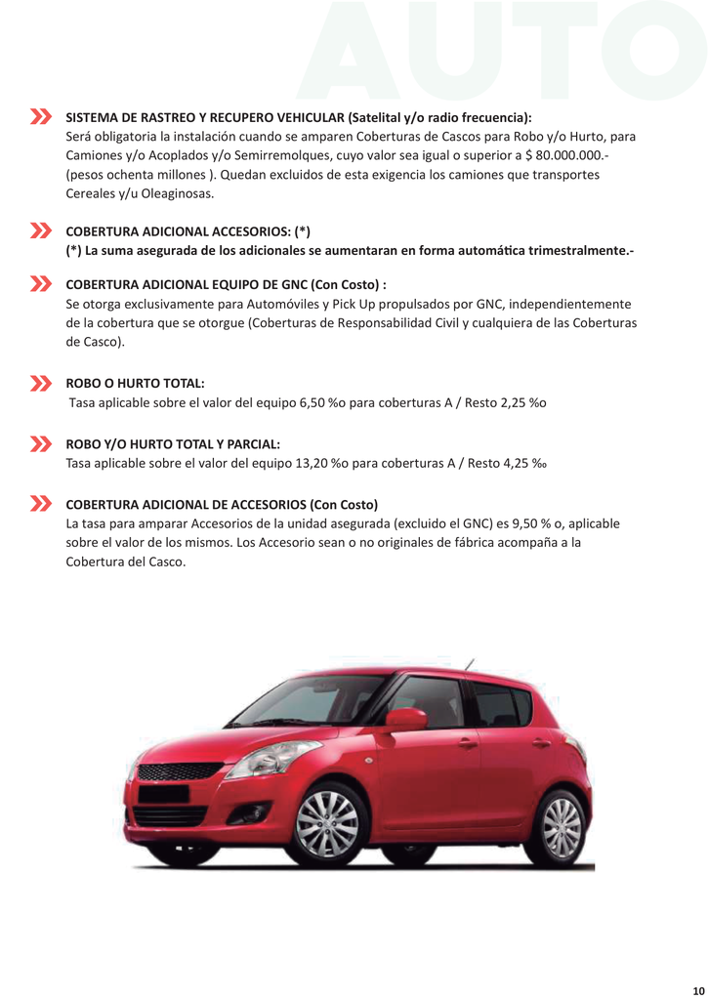

Extrayendo texto de página 10...

--- Procesando página 11 ---


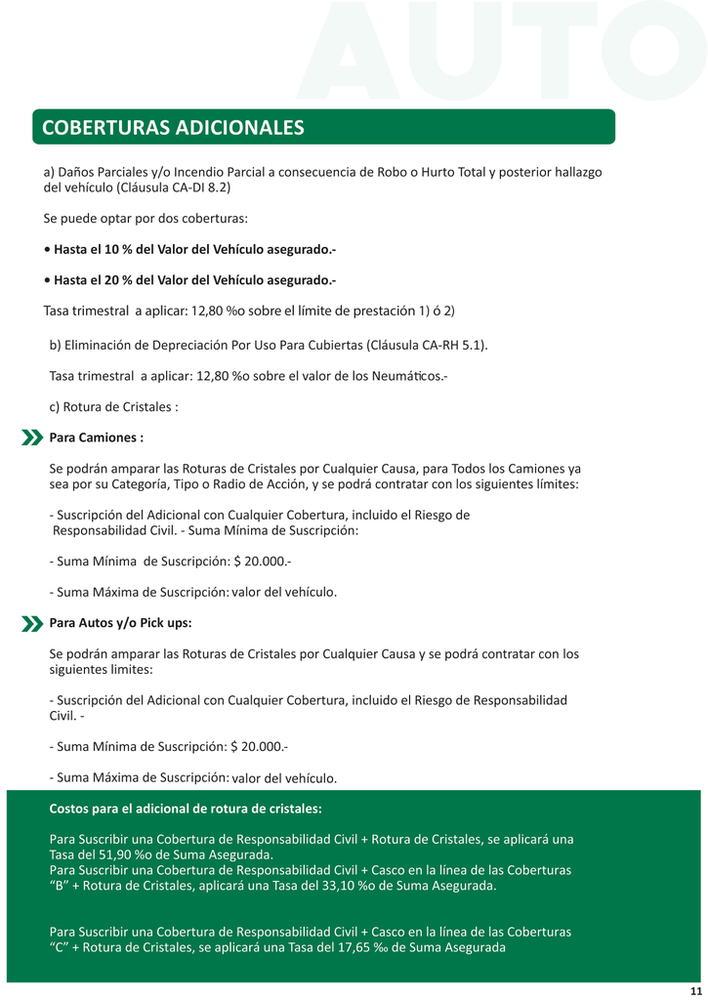

Extrayendo texto de página 11...

--- Procesando página 12 ---


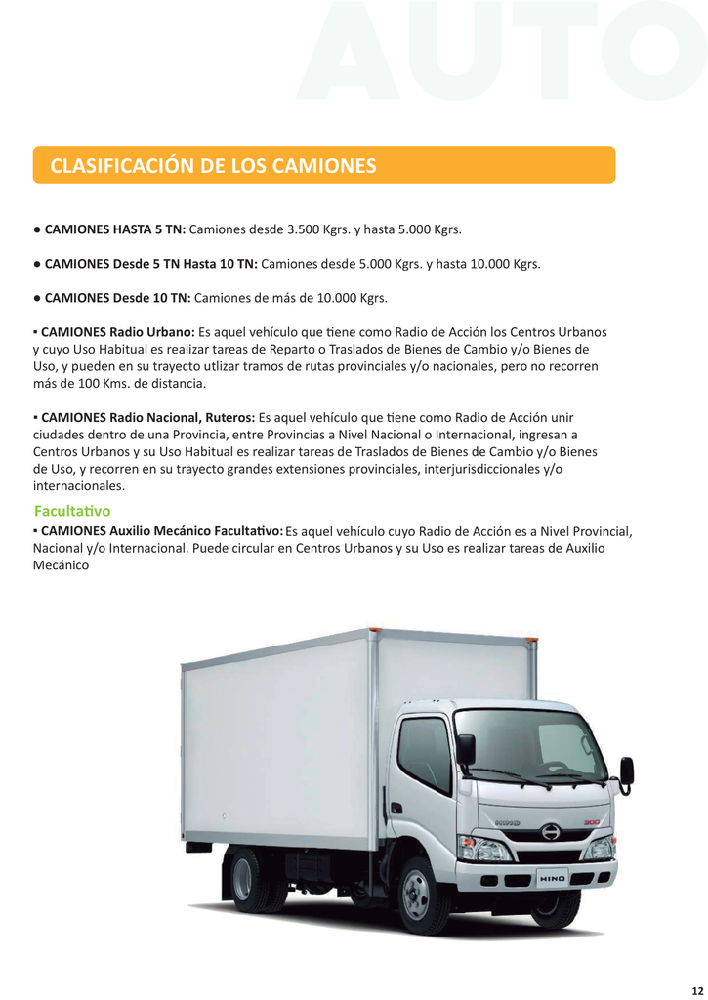

Extrayendo texto de página 12...

--- Procesando página 13 ---


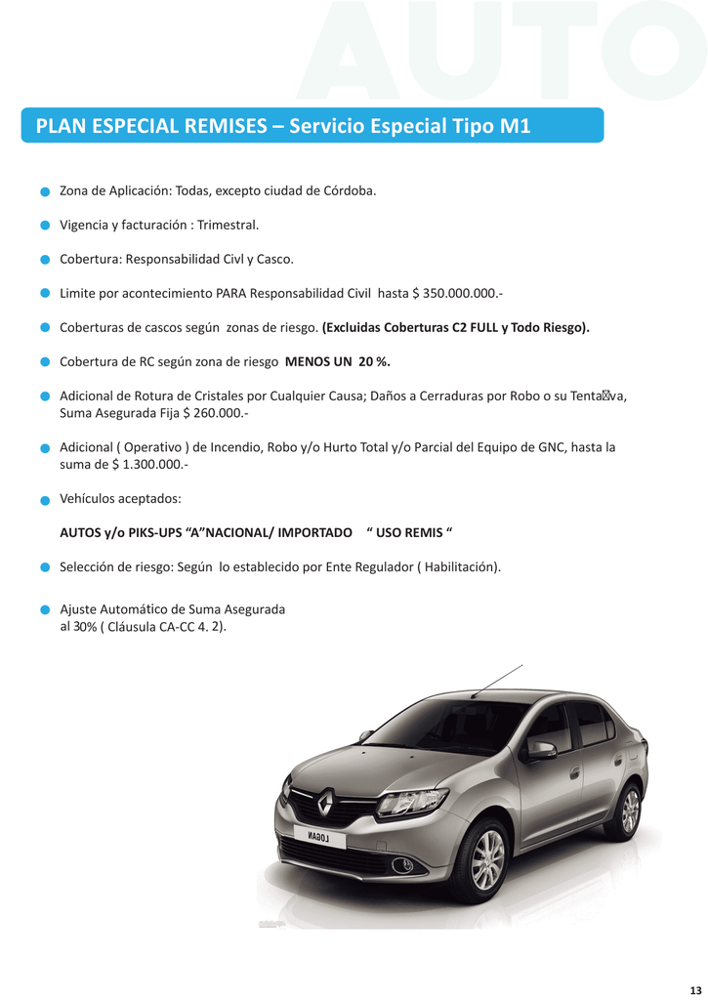

Extrayendo texto de página 13...

--- Procesando página 14 ---


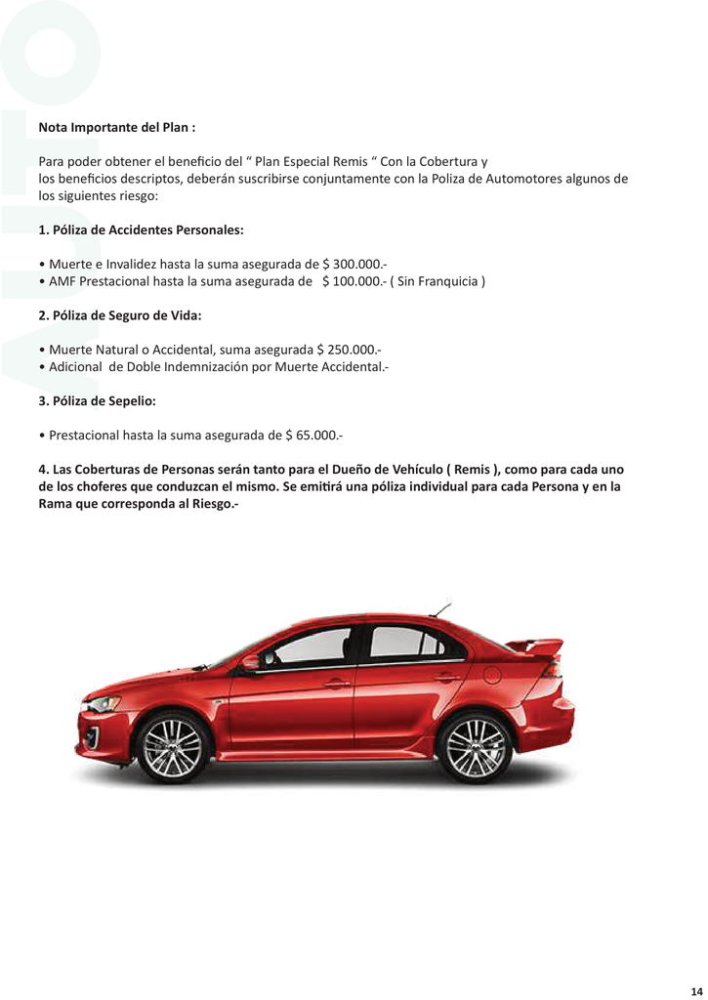

Extrayendo texto de página 14...

--- Procesando página 15 ---


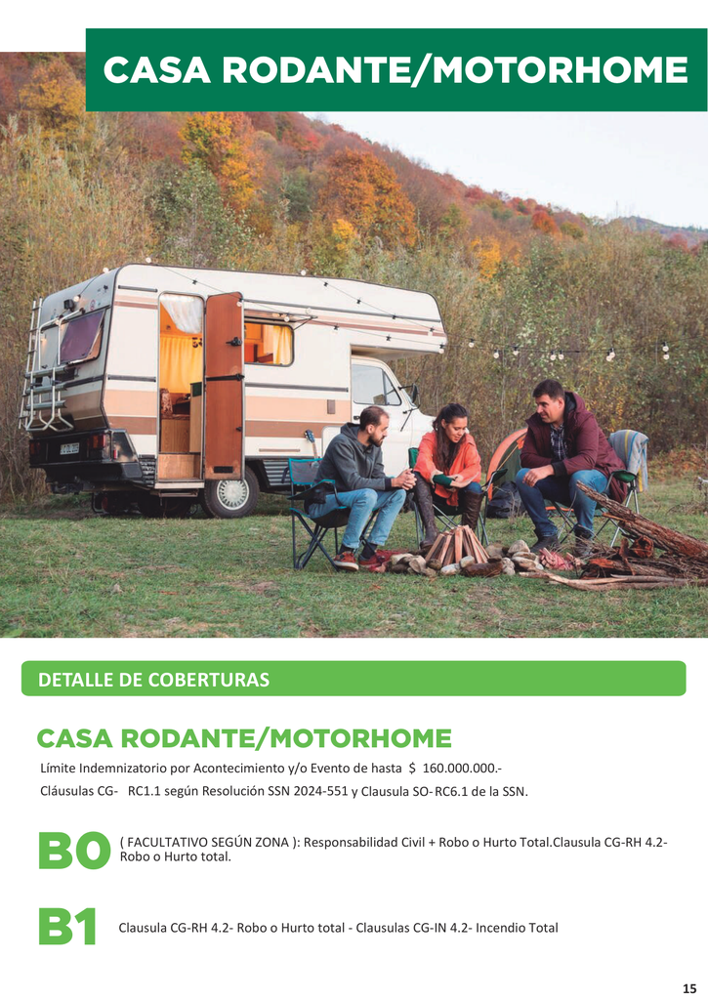

Extrayendo texto de página 15...

--- Procesando página 16 ---


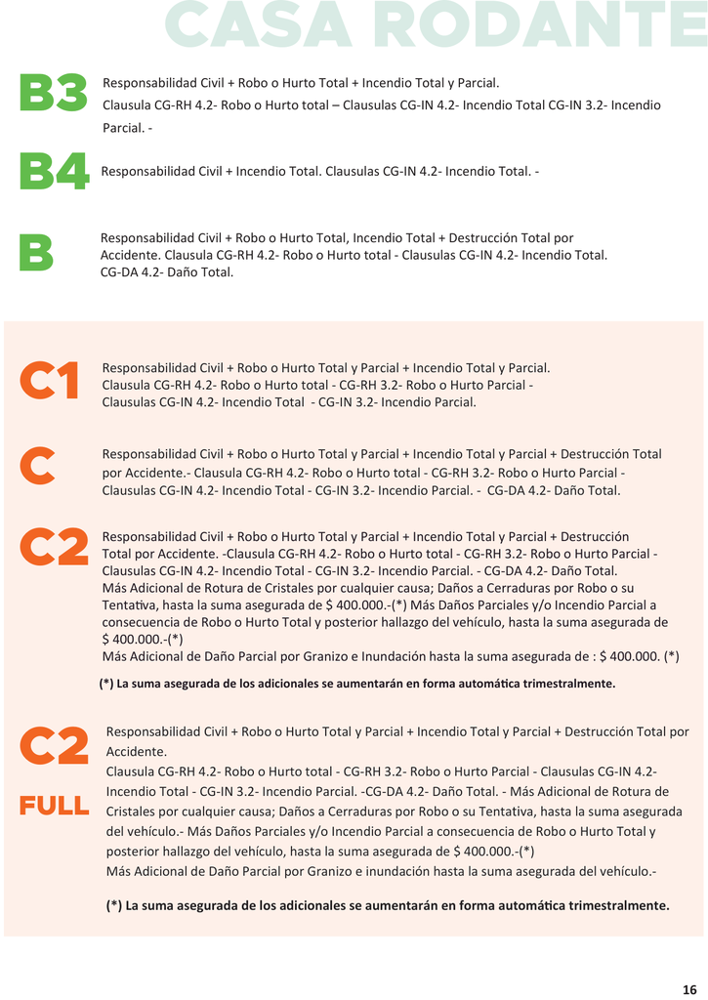

Extrayendo texto de página 16...

--- Procesando página 17 ---


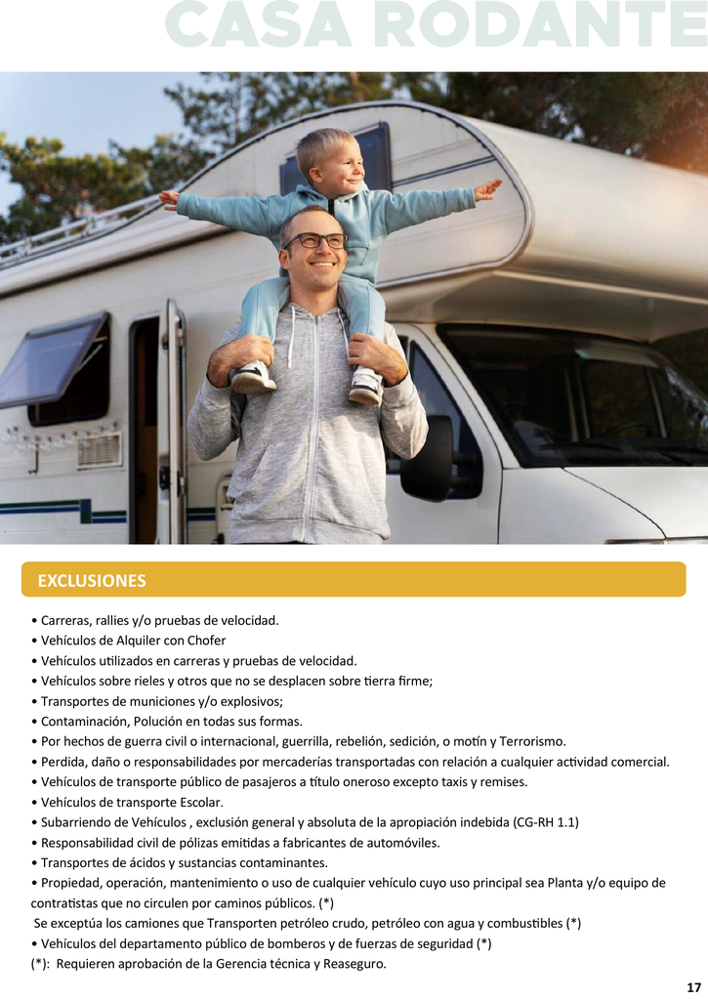

Extrayendo texto de página 17...

--- Procesando página 18 ---


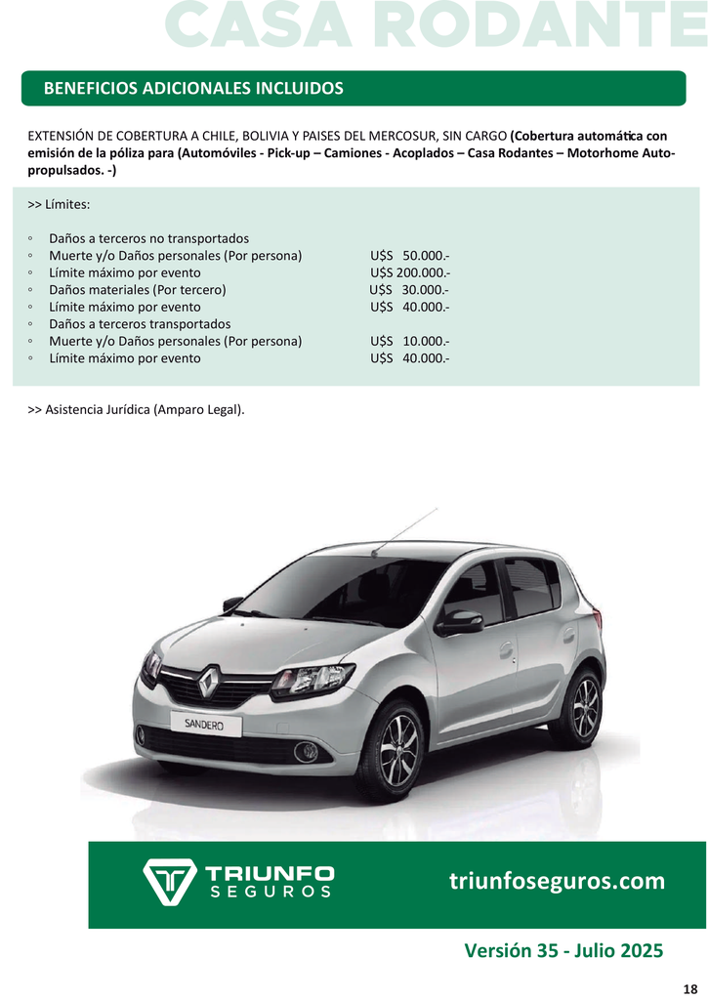

Extrayendo texto de página 18...

TEXTO COMPLETO EXTRAÍDO:
=== TEXTO EXTRAÍDO DE: MANUAL+AUTO+JULIO+2025 (4).pdf ===


--- PÁGINA 1 ---
user

Extract ALL text from this image. Transcribe every word, number, and symbol you can see. 
Maintain the original formatting and structure as much as possible. 
Include headers, paragraphs, bullet points, and any other text elements.
If there are tables, preserve their structure.
Be thorough and accurate.assistant

The image displays the cover page of a Spanish-language document titled "AUTOMOTORES Manual de producto y tarifa JULIO 2025." The title is prominently displayed in white text within a green rectangle at the bottom of the page.

**Key Elements:**

* **Image:** A photograph of a blue car driving on a highway, with trees and a blue sky with clouds in the background.
* **Title:** "AUTOMOTORES" in white text within a green rectangle, followed by "Manual de producto y tarifa JULIO 2025" in smaller white text below.
* **Logo:** A green logo fea

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [23]:
pdf_text_extraction_menu()

<a name="Train"></a>
### Train the model
Now let's use Huggingface TRL's `SFTTrainer`! More docs here: [TRL SFT docs](https://huggingface.co/docs/trl/sft_trainer). We do 60 steps to speed things up, but you can set `num_train_epochs=1` for a full run, and turn off `max_steps=None`. We also support TRL's `DPOTrainer`!

We use our new `UnslothVisionDataCollator` which will help in our vision finetuning setup.

In [ ]:
from unsloth.trainer import UnslothVisionDataCollator
from trl import SFTTrainer, SFTConfig

FastVisionModel.for_training(model) # Enable for training!

trainer = SFTTrainer(
    model = model,
    tokenizer = tokenizer,
    data_collator = UnslothVisionDataCollator(model, tokenizer), # Must use!
    train_dataset = converted_dataset,
    args = SFTConfig(
        per_device_train_batch_size = 2,
        gradient_accumulation_steps = 4,
        warmup_steps = 5,
        max_steps = 30,
        # num_train_epochs = 1, # Set this instead of max_steps for full training runs
        learning_rate = 2e-4,
        logging_steps = 1,
        optim = "adamw_8bit",
        weight_decay = 0.01,
        lr_scheduler_type = "linear",
        seed = 3407,
        output_dir = "outputs",
        report_to = "none",     # For Weights and Biases

        # You MUST put the below items for vision finetuning:
        remove_unused_columns = False,
        dataset_text_field = "",
        dataset_kwargs = {"skip_prepare_dataset": True},
        max_seq_length = 2048,
    ),
)

max_steps is given, it will override any value given in num_train_epochs


In [ ]:
# @title Show current memory stats
gpu_stats = torch.cuda.get_device_properties(0)
start_gpu_memory = round(torch.cuda.max_memory_reserved() / 1024 / 1024 / 1024, 3)
max_memory = round(gpu_stats.total_memory / 1024 / 1024 / 1024, 3)
print(f"GPU = {gpu_stats.name}. Max memory = {max_memory} GB.")
print(f"{start_gpu_memory} GB of memory reserved.")

GPU = Tesla T4. Max memory = 14.748 GB.
8.477 GB of memory reserved.


In [ ]:
trainer_stats = trainer.train()

==((====))==  Unsloth - 2x faster free finetuning | Num GPUs = 1
   \\   /|    Num examples = 1,978 | Num Epochs = 1
O^O/ \_/ \    Batch size per device = 2 | Gradient Accumulation steps = 4
\        /    Total batch size = 8 | Total steps = 30
 "-____-"     Number of trainable parameters = 67,174,400
🦥 Unsloth needs about 1-3 minutes to load everything - please wait!


Step,Training Loss
1,3.611500
2,3.613000
3,3.488000
4,3.600900
5,3.031900
6,2.884400
7,2.446000
8,2.323400
9,1.984300
10,1.647600


In [ ]:
# @title Show final memory and time stats
used_memory = round(torch.cuda.max_memory_reserved() / 1024 / 1024 / 1024, 3)
used_memory_for_lora = round(used_memory - start_gpu_memory, 3)
used_percentage = round(used_memory / max_memory * 100, 3)
lora_percentage = round(used_memory_for_lora / max_memory * 100, 3)
print(f"{trainer_stats.metrics['train_runtime']} seconds used for training.")
print(
    f"{round(trainer_stats.metrics['train_runtime']/60, 2)} minutes used for training."
)
print(f"Peak reserved memory = {used_memory} GB.")
print(f"Peak reserved memory for training = {used_memory_for_lora} GB.")
print(f"Peak reserved memory % of max memory = {used_percentage} %.")
print(f"Peak reserved memory for training % of max memory = {lora_percentage} %.")

957.9653 seconds used for training.
15.97 minutes used for training.
Peak reserved memory = 10.287 GB.
Peak reserved memory for training = 1.81 GB.
Peak reserved memory % of max memory = 69.752 %.
Peak reserved memory for training % of max memory = 12.273 %.


<a name="Inference"></a>
### Inference
Let's run the model! You can change the instruction and input - leave the output blank!

We use `min_p = 0.1` and `temperature = 1.5`. Read this [Tweet](https://x.com/menhguin/status/1826132708508213629) for more information on why.

In [ ]:
FastVisionModel.for_inference(model) # Enable for inference!

image = dataset[0]["image"]
instruction = "You are an expert radiographer. Describe accurately what you see in this image."

messages = [
    {"role": "user", "content": [
        {"type": "image"},
        {"type": "text", "text": instruction}
    ]}
]
input_text = tokenizer.apply_chat_template(messages, add_generation_prompt = True)
inputs = tokenizer(
    image,
    input_text,
    add_special_tokens = False,
    return_tensors = "pt",
).to("cuda")

from transformers import TextStreamer
text_streamer = TextStreamer(tokenizer, skip_prompt = True)
_ = model.generate(**inputs, streamer = text_streamer, max_new_tokens = 128,
                   use_cache = True, temperature = 1.5, min_p = 0.1)

Panoramic radiography shows multiple small osteolytic lesions in the right mandibular ramus, condyle and ascending ramus, the left mandibular condyle, left first molar and body, right first and second premolar, left first, second and third molars (arrows).<|eot_id|>


<a name="Save"></a>
### Saving, loading finetuned models
To save the final model as LoRA adapters, either use Huggingface's `push_to_hub` for an online save or `save_pretrained` for a local save.

**[NOTE]** This ONLY saves the LoRA adapters, and not the full model. To save to 16bit or GGUF, scroll down!

In [ ]:
model.save_pretrained("lora_model")  # Local saving
tokenizer.save_pretrained("lora_model")
# model.push_to_hub("your_name/lora_model", token = "...") # Online saving
# tokenizer.push_to_hub("your_name/lora_model", token = "...") # Online saving

[]

Now if you want to load the LoRA adapters we just saved for inference, set `False` to `True`:

In [ ]:
if False:
    from unsloth import FastVisionModel
    model, tokenizer = FastVisionModel.from_pretrained(
        model_name = "lora_model", # YOUR MODEL YOU USED FOR TRAINING
        load_in_4bit = True, # Set to False for 16bit LoRA
    )
    FastVisionModel.for_inference(model) # Enable for inference!

image = dataset[0]["image"]
instruction = "You are an expert radiographer. Describe accurately what you see in this image."

messages = [
    {"role": "user", "content": [
        {"type": "image"},
        {"type": "text", "text": instruction}
    ]}
]
input_text = tokenizer.apply_chat_template(messages, add_generation_prompt = True)
inputs = tokenizer(
    image,
    input_text,
    add_special_tokens = False,
    return_tensors = "pt",
).to("cuda")

from transformers import TextStreamer
text_streamer = TextStreamer(tokenizer, skip_prompt = True)
_ = model.generate(**inputs, streamer = text_streamer, max_new_tokens = 128,
                   use_cache = True, temperature = 1.5, min_p = 0.1)

Panoramic radiograph of the jaw showing well-defined radiolucency (arrowheads) of the right side and unerupted second permanent maxillary molar (arrow).<|eot_id|>


### Saving to float16 for VLLM

We also support saving to `float16` directly. Select `merged_16bit` for float16. Use `push_to_hub_merged` to upload to your Hugging Face account! You can go to https://huggingface.co/settings/tokens for your personal tokens.

In [ ]:
# Select ONLY 1 to save! (Both not needed!)

# Save locally to 16bit
if False: model.save_pretrained_merged("unsloth_finetune", tokenizer,)

# To export and save to your Hugging Face account
if False: model.push_to_hub_merged("YOUR_USERNAME/unsloth_finetune", tokenizer, token = "PUT_HERE")

And we're done! If you have any questions on Unsloth, we have a [Discord](https://discord.gg/unsloth) channel! If you find any bugs or want to keep updated with the latest LLM stuff, or need help, join projects etc, feel free to join our Discord!

Some other links:
1. Train your own reasoning model - Llama GRPO notebook [Free Colab](https://colab.research.google.com/github/unslothai/notebooks/blob/main/nb/Llama3.1_(8B)-GRPO.ipynb)
2. Saving finetunes to Ollama. [Free notebook](https://colab.research.google.com/github/unslothai/notebooks/blob/main/nb/Llama3_(8B)-Ollama.ipynb)
3. Llama 3.2 Vision finetuning - Radiography use case. [Free Colab](https://colab.research.google.com/github/unslothai/notebooks/blob/main/nb/Llama3.2_(11B)-Vision.ipynb)
6. See notebooks for DPO, ORPO, Continued pretraining, conversational finetuning and more on our [documentation](https://docs.unsloth.ai/get-started/unsloth-notebooks)!

<div class="align-center">
  <a href="https://unsloth.ai"><img src="https://github.com/unslothai/unsloth/raw/main/images/unsloth%20new%20logo.png" width="115"></a>
  <a href="https://discord.gg/unsloth"><img src="https://github.com/unslothai/unsloth/raw/main/images/Discord.png" width="145"></a>
  <a href="https://docs.unsloth.ai/"><img src="https://github.com/unslothai/unsloth/blob/main/images/documentation%20green%20button.png?raw=true" width="125"></a>

  Join Discord if you need help + ⭐️ <i>Star us on <a href="https://github.com/unslothai/unsloth">Github</a> </i> ⭐️
</div>
